# DESCRIPTION: Generate Figure 1. Introduction to low dimensional representations of tvFC data

This notebook will generate all the panels in Figure 1 (Introduction) and saves them to ```<PRJ_DIR>/Outputs/Figure01/```




To do that it requires three files made available in ```Resources/Figure01```:

* ```winlabels_wl030_ws001.csv```: This file contains the information regarding what task was performed during each window. It contains one string (e.g., REST, VIDEO, etc) per line and has as many lines as windows.
* ```ROI_Coordinates.txt```: This file contains the coordinates for the centroid of each ROI. We need this information to sort connections on the basis of hemispheric membership.
* ```sbj06_ctask001_nroi0200_wl030_ws001.csv```: This file contains the representative timeseries for one multi-task scan.

In [1]:
from scipy.io import loadmat
import os.path as osp
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import panel as pn
import seaborn as sns
import plotly.express as px
import csv
from matplotlib.patches import Rectangle
import matplotlib.image as mpimg
from IPython import display
pn.extension('plotly')

In [2]:
from utils.data_functions import compute_SWC
from utils.basics import PRJ_DIR, task_cmap, wls, wss, tr
from utils.random import seed_value
from sklearn.utils import check_random_state

In order to compute the Sliding Window Connectivity matrix, we need to know the repetition time (TR), the window duration and the window step. Those are defined below

In [3]:
WL_secs = wls      # Window length in seconds
WL_trs  = int(WL_secs/tr)
WS_secs = wss
WS_trs  = int(WS_secs/tr)

random_state = check_random_state(seed_value)

Creates variable with the path where the necessary files reside

In [4]:
fig01_output_folder = osp.join(PRJ_DIR,'Outputs','Figure01')
if not osp.exists(fig01_output_folder):
    os.makedirs(fig01_output_folder)

These dictionaries will be used to atomatically set some plotting options for Plotly 3D scatter plots

*** 
## 1. Load ROI timeseries for one scan

In [5]:
roi_path = osp.join(PRJ_DIR,'Data','PNAS2015','SBJ06','SBJ06_Craddock_0200.WL045s_000.netts')
roi_ts = pd.read_csv(roi_path, sep='\t', header=None).T
roi_ts.columns.name = 'ROI_Name'
roi_ts.columns = ['ROI{r}'.format(r=str(i).zfill(3)) for i in np.arange(157)]
roi_ts.index   = pd.timedelta_range(start='0',periods=roi_ts.shape[0],freq='{tr}L'.format(tr=tr*1000))
roi_ts

,ROI000,ROI001,ROI002,ROI003,ROI004,ROI005,ROI006,ROI007,ROI008,ROI009,...,ROI147,ROI148,ROI149,ROI150,ROI151,ROI152,ROI153,ROI154,ROI155,ROI156
0 days 00:00:00,0.12340,-0.1608,-0.1109,-0.279800,-0.04459,-0.57870,-0.05007,0.24510,-0.19470,-0.7021,...,-0.60160,-0.05144,-0.87820,-0.11290,-0.21620,-0.12800,0.44060,-0.69080,-0.46690,0.21110
0 days 00:00:01.500000,-0.00742,-0.1756,0.1778,-0.232400,0.26680,-0.36060,-0.06880,-0.08258,-0.08447,-0.3215,...,-0.54390,-0.13080,-0.96660,0.02533,-0.04878,-0.06032,0.40870,-0.40410,-0.62900,0.13770
0 days 00:00:03,0.22680,0.1087,0.4613,-0.057400,0.33880,0.16920,0.32340,-0.31400,0.30240,0.5793,...,-0.12340,-0.04362,-0.48690,0.08131,0.24480,0.29730,0.16850,0.42560,-0.27440,-0.11840
0 days 00:00:04.500000,0.49040,0.6196,0.4648,0.029420,0.26440,0.46180,0.92220,-0.20350,0.66150,1.1080,...,0.17930,0.06012,0.08426,0.15130,0.57900,0.60570,0.15540,0.99470,0.22320,-0.16230
0 days 00:00:06,0.21660,0.8645,0.1403,-0.059530,0.29260,0.34540,0.92120,-0.04689,0.61340,0.8479,...,0.24080,0.03020,0.48880,0.24700,0.76830,0.49680,0.29890,0.93010,0.41820,-0.03195
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0 days 00:25:18,-0.02867,0.3979,0.1351,0.253900,0.39160,0.14800,0.05057,-0.25850,0.31500,0.1691,...,0.16200,0.03511,0.01547,0.40380,0.35050,0.06990,-0.06060,-0.08662,0.20080,-0.07802
0 days 00:25:19.500000,-0.52890,0.2370,-0.3036,-0.001867,0.69370,-0.20370,-0.76850,-0.51670,0.25240,-0.3691,...,0.13100,-0.55420,0.61970,0.31640,0.26420,-0.01197,0.08498,-0.33280,0.64330,-0.18520
0 days 00:25:21,-0.97870,-0.3384,-0.2476,-0.183100,0.50230,-0.30430,-1.05700,-0.35500,-0.05198,-0.3529,...,-0.03252,-0.76900,0.76820,-0.07901,-0.03777,-0.12690,-0.05605,-0.25850,0.65380,-0.21900
0 days 00:25:22.500000,-0.83760,-0.6542,0.1192,-0.068580,-0.10180,-0.12800,-0.51360,-0.02659,-0.25840,0.0150,...,-0.26760,-0.44350,0.07661,-0.38150,-0.28120,-0.28250,-0.17690,-0.16310,0.07006,-0.09364


In [6]:
## Write ROI Names for this dataset into a text file for easy access later
## =======================================================================
pnas2015_roi_names = list(roi_ts.columns)
pnas2015_roi_names_path = osp.join(PRJ_DIR,'Resources','PNAS2015_ROI_Names.txt')
# open file in write mode
with open(pnas2015_roi_names_path, 'w') as fp:
    for item in pnas2015_roi_names:
        # write each item on a new line
        fp.write("%s\n" % item)

***
## 2. Compute Sliding Window Correlation Matrix

Load information about what task is being performed in each window

In [7]:
win_labels = np.loadtxt(osp.join(PRJ_DIR,'Resources','PNAS2015_WinNames_wl45s_ws1p5s.txt'), dtype='str')
print('++ INFO: Number of available window labels: %d' % len(win_labels))

++ INFO: Number of available window labels: 988


Compute the tvFC matrix

In [8]:
%%time
swc_r,swc_Z, winInfo = compute_SWC(roi_ts,WL_trs,WS_trs,win_names=win_labels,window=None)
swc_r.index.name = 'Connections'
swc_Z.index.name = 'Connections'
print("++ INFO: Size of sliding window correlation: %s" % str(swc_r.shape))

Window:   0%|          | 0/988 [00:00<?, ?it/s]

++ INFO: Size of sliding window correlation: (12246, 988)
CPU times: user 28.4 s, sys: 797 ms, total: 29.2 s
Wall time: 29.2 s


In [9]:
swc_r

REST      REST      REST      REST      REST      REST  \
ROI001 ROI000  0.103624  0.088466  0.099402  0.127457  0.105022  0.073243   
ROI002 ROI000  0.383051  0.357024  0.359827  0.355013  0.331429  0.347902   
       ROI001  0.496596  0.567586  0.602868  0.619497  0.621010  0.602688   
ROI003 ROI000  0.426384  0.454358  0.445923  0.448796  0.457761  0.455536   
       ROI001  0.235150  0.143410  0.038598  0.033367  0.098204  0.091511   
...                 ...       ...       ...       ...       ...       ...   
ROI156 ROI151  0.002427  0.094594  0.119010  0.136871  0.212342  0.259093   
       ROI152  0.196456  0.257893  0.236187  0.228463  0.271697  0.356058   
       ROI153 -0.220580 -0.234434 -0.235593 -0.211544 -0.181325 -0.078557   
       ROI154  0.142174  0.254424  0.299782  0.326120  0.423612  0.426370   
       ROI155 -0.121567  0.010079  0.089769  0.067967  0.050505  0.037268   

                   REST      REST      REST      REST  ...      VIDE  \
ROI001 ROI000  0.077917  0.068748  0.122291  0.175701  ... -0.081955   
ROI002 ROI000  0.342511  0.246807  0.226456  0.307684  ...  0.070347   
       ROI001  0.572362  0.594703  0.641580  0.654697  ... -0.050872   
ROI003 ROI000  0.439325  0.390658  0.395973  0.487925  ... -0.491010   
       ROI001 -0.031529 -0.115877 -0.073377 -0.017940  ...  0.112835   
...                 ...       ...       ...       ...  ...       ...   
ROI156 ROI151  0.288068  0.317966  0.313202  0.312164  ...  0.458400   
       ROI152  0.482334  0.470661  0.384949  0.329446  ... -0.175677   
       ROI153  0.031420  0.006796 -0.040493  0.027607  ... -0.177431   
       ROI154  0.501830  0.481858  0.361838  0.351312  ...  0.275768   
       ROI155  0.138608  0.159015  0.088254  0.086667  ... -0.039073   

                   VIDE      VIDE      VIDE      VIDE      VIDE      VIDE  \
ROI001 ROI000 -0.092285 -0.120092 -0.115778 -0.111926 -0.121459 -0.132374   
ROI002 ROI000 -0.037753 -0.061365 -0.021048 -0.004031 -0.008269  0.078513   
       ROI001  0.062597  0.121699 -0.025308 -0.052036 -0.027780 -0.084887   
ROI003 ROI000 -0.533631 -0.529273 -0.518258 -0.507591 -0.506958 -0.483127   
       ROI001  0.144840  0.139178  0.069831  0.038323  0.077281  0.049601   
...                 ...       ...       ...       ...       ...       ...   
ROI156 ROI151  0.477422  0.439486  0.385747  0.380174  0.353934  0.313214   
       ROI152 -0.254215 -0.229992 -0.188862 -0.177495 -0.179223 -0.183605   
       ROI153 -0.252323 -0.218042 -0.151844 -0.132439 -0.128935 -0.144743   
       ROI154  0.258438  0.277394  0.313106  0.329698  0.335069  0.356312   
       ROI155 -0.015287 -0.028437 -0.099381 -0.146009 -0.157272 -0.193483   

                   VIDE      VIDE      VIDE  
ROI001 ROI000 -0.046784  0.064521  0.092650  
ROI002 ROI000  0.163457  0.130138  0.111118  
       ROI001 -0.072676 -0.118742 -0.161185  
ROI003 ROI000 -0.388890 -0.355061 -0.361623  
       ROI001  0.035486  0.044414  0.019400  
...                 ...       ...       ...  
ROI156 ROI151  0.310863  0.313598  0.287250  
       ROI152 -0.142465 -0.097528 -0.114199  
       ROI153 -0.153101 -0.145853 -0.139926  
       ROI154  0.379478  0.380188  0.357734  
       ROI155 -0.231958 -0.230399 -0.253210  

[12246 rows x 988 columns]

***
## 3. Compute Different Matrix Sortings

In Figure 1, we will plot the same tvFC matrix sorting connections in three different ways: 1) in descending order of mean FC, 2) in descencing order of FC volatility (as indexed by the coefficient of variance), and 3) based on hemispheric membership. The next few cells in this section will generate the appropriate indexes with each of these sorting schemes.

First, we do 1) mean and 2) volatility

In [10]:
volatility_sorting_idx = (swc_r.std(axis=1)/swc_r.mean(axis=1).abs()).sort_values(ascending=False).index
mean_sorting_idx       = swc_r.mean(axis=1).sort_values(ascending=False).index

Next, we also compute sorting of connections based on hemispheric membership

In [11]:
ROI_CMs = pd.read_csv(osp.join(PRJ_DIR,'Resources','ROI_Coordinates.txt'), index_col='ROI_ID')

In [12]:
con_info = pd.DataFrame(index=swc_r.index,columns=['Hemi_A','Hemi_B'])
for i,j in swc_r.index:
    if ROI_CMs.loc[i,'x']<0:
        con_info.loc[(i,j),'Hemi_A'] = 'R'
    else:
        con_info.loc[(i,j),'Hemi_A'] = 'L'
    if ROI_CMs.loc[j,'x']<0:
        con_info.loc[(i,j),'Hemi_B'] = 'R'
    else:
        con_info.loc[(i,j),'Hemi_B'] = 'L'

In [13]:
LL_Cons = con_info[(con_info['Hemi_A']=='L') & (con_info['Hemi_B']=='L')].index
RR_Cons = con_info[(con_info['Hemi_A']=='R') & (con_info['Hemi_B']=='R')].index
LR_Cons = con_info[(con_info['Hemi_A']=='L') & (con_info['Hemi_B']=='R')].index
RL_Cons = con_info[(con_info['Hemi_A']=='R') & (con_info['Hemi_B']=='L')].index

## 4. Plot the Matrix at scale

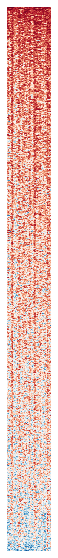

In [14]:
fig,ax = plt.subplots(1,1, figsize=(10,10))
sns.heatmap(swc_r.loc[mean_sorting_idx],cmap='RdBu_r', vmin=-1, vmax=1, xticklabels=False, yticklabels=False, square=True, cbar=False)
ax.set(ylabel=None);

## 5. Plot the matrix with the different sortings

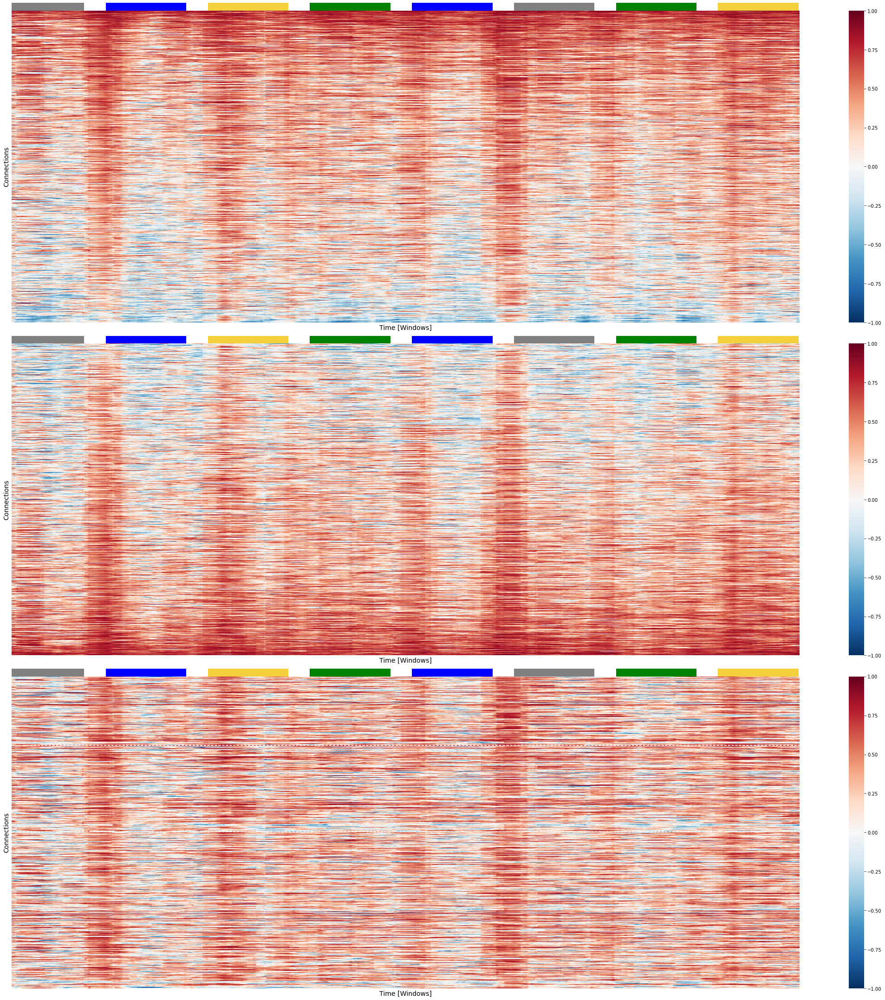

In [15]:
plt.rcParams["figure.autolayout"] = True
fig, axs = plt.subplots(3,1,figsize=(30,30))
for i,(df,title) in enumerate(zip([swc_r.loc[mean_sorting_idx],swc_r.loc[volatility_sorting_idx],pd.concat([swc_r.loc[LL_Cons],swc_r.loc[RR_Cons],swc_r.loc[LR_Cons],swc_r.loc[RL_Cons]])],
                                ['Average Strength','Volatility','Hemisphere'])):
    plot1    = sns.heatmap(df, ax=axs[i],cmap='RdBu_r', vmin=-1, vmax=1, xticklabels=False, yticklabels=False)
    plot1.set_xlabel('Time [Windows]', fontsize=14)
    plot1.set_ylabel('Connections',    fontsize=14)
    #plot1.set_title(title, fontsize=14)
    plot1.add_patch(Rectangle((0, -301),          91, 300, fill=True, color=task_cmap['Rest'], lw=0, clip_on=False))
    plot1.add_patch(Rectangle((91+27, -301),     101, 300, fill=True, color=task_cmap['Memory'], lw=0, clip_on=False))
    plot1.add_patch(Rectangle((91+(2*27)+101, -301), 101, 300, fill=True, color=task_cmap['Video'], lw=0, clip_on=False))
    plot1.add_patch(Rectangle((91+(3*27)+(2*101), -301), 101, 300, fill=True, color=task_cmap['Math'], lw=0, clip_on=False))
    plot1.add_patch(Rectangle((91+(4*27)+(3*101), -301), 101, 300, fill=True, color=task_cmap['Memory'], lw=0, clip_on=False))
    plot1.add_patch(Rectangle((91+(5*27)+(4*101), -301), 101, 300, fill=True, color=task_cmap['Rest'], lw=0, clip_on=False))
    plot1.add_patch(Rectangle((91+(6*27)+(5*101), -301), 101, 300, fill=True, color=task_cmap['Math'], lw=0, clip_on=False))
    plot1.add_patch(Rectangle((91+(7*27)+(6*101), -301), 101, 300, fill=True, color=task_cmap['Video'], lw=0, clip_on=False))
    if i == 2:
        axs[i].hlines([LL_Cons.shape[0],LL_Cons.shape[0]+RR_Cons.shape[0]],*axs[i].get_xlim(), colors='w', linestyles='dashed')

***
## 6. Generate LE

The last four panels of figure 1 depict a two low dimensional representations of this data generated with Laplacian Eigenmaps:

* A behaviorally informative embedding generated using appropriate hyperparameters (panels E,F & G). The same low dimensional representation of the data is depicted with three different coloring schemes:
    * one color
    * colors according to task
    * colors according to time
* A non-informative embedding using an excessively low knn value.

LE representations are generated using the scikit-learn library. The necessary functions are imported next

In [16]:
from sklearn.manifold import SpectralEmbedding
from sklearn.neighbors import kneighbors_graph

We now generate an Spectral Embedding object that will generate a 3D represenation (n_components=3) and will expect a pre-computed affinity matrix. We set the random_seed to 43 for reproducibility of results

In [17]:
# Create Embedding Object
LE_obj     = SpectralEmbedding(n_components=3, affinity='precomputed', n_jobs=-1, random_state=random_state)

First, we create a meaningful embedding using knn=90 duirng the computation of the affinity matrix. In addition to the 3D coordinates, we add two additional columns to the resulting panda object. One contains the task information and another one timing information. These two columns are only used for plotting purposes, but do not contribute in any way to the generation of the embeddings.

In [18]:
# Create Affinity Matrix with valid neighborhood size
X_affinity_correct = pd.DataFrame(kneighbors_graph(swc_Z.T, 90, include_self=False, n_jobs=-1, metric='correlation', mode='connectivity').toarray())
X_affinity_correct = 0.5 * (X_affinity_correct + X_affinity_correct.T)
#Belkin Symmetrization: 
#X_affinity_correct = ((0.5 * (X_affinity_correct + X_affinity_correct.T)) > 0).astype(int)
# Compute Embedding based on valid neiighborhood size
LE_correct         = pd.DataFrame(LE_obj.fit_transform(X_affinity_correct),columns=['Dim_'+str(i+1).zfill(2) for i in np.arange(3)])
LE_correct['Task'] = win_labels
LE_correct['Time'] = np.arange(LE_correct.shape[0])+1

Finally, we also create a not so meaningful embedding using a excessively low knn value.

In [19]:
# Create Affinity Matrix with valid neighborhood size
X_affinity_incorrect = pd.DataFrame(kneighbors_graph(swc_Z.T, 5, include_self=False, n_jobs=-1, metric='correlation', mode='connectivity').toarray())
X_affinity_incorrect = 0.5 * (X_affinity_incorrect + X_affinity_incorrect.T)
#Belkin Symmetrization: 
#X_affinity_incorrect = ((0.5 * (X_affinity_incorrect + X_affinity_incorrect.T)) > 0).astype(int)
# Compute Embedding based on valid neiighborhood size
LE_incorrect         = pd.DataFrame(LE_obj.fit_transform(X_affinity_incorrect),columns=['Dim_'+str(i+1).zfill(2) for i in np.arange(3)])
LE_incorrect['Task'] = win_labels
LE_incorrect['Time'] = np.arange(LE_incorrect.shape[0])+1

Here, we now plot the different versions of these two embeddings

In [20]:
camera = dict( up=dict(x=0, y=0, z=1), center=dict(x=0, y=0, z=0), eye=dict(x=2, y=2, z=1))

In [21]:
scene_correct_le = dict(
        xaxis = dict(nticks=4, range=[-.005,.005], gridcolor="black", showbackground=True, zerolinecolor="black",backgroundcolor='rgb(230,230,230)'),
        yaxis = dict(nticks=4, range=[-.005,.005], gridcolor="black", showbackground=True, zerolinecolor="black",backgroundcolor='rgb(230,230,230)'),
        zaxis = dict(nticks=4, range=[-.005,.005], gridcolor="black", showbackground=True, zerolinecolor="black",backgroundcolor='rgb(230,230,230)'))
scene_incorrect_le = dict(
        xaxis = dict(nticks=4, range=[-.02,.02], gridcolor="black", showbackground=True, zerolinecolor="black",backgroundcolor='rgb(230,230,230)'),
        yaxis = dict(nticks=4, range=[-.02,.02], gridcolor="black", showbackground=True, zerolinecolor="black",backgroundcolor='rgb(230,230,230)'),
        zaxis = dict(nticks=4, range=[-.02,.02], gridcolor="black", showbackground=True, zerolinecolor="black",backgroundcolor='rgb(230,230,230)'))

In [22]:
camera = dict( up=dict(x=0, y=0, z=1), center=dict(x=0, y=0, z=0), eye=dict(x=1, y=2, z=2))
fig_nocolor = px.scatter_3d(LE_correct,x='Dim_02',y='Dim_01',z='Dim_03', width=500, height=500, opacity=0.5)
fig_nocolor.update_layout(scene_camera=camera, scene=scene_correct_le,scene_aspectmode='cube',margin=dict(l=0, r=0, b=0, t=0));
fig_nocolor.update_traces(marker_size = 5)
fig_time = px.scatter_3d(LE_correct,x='Dim_02',y='Dim_01',z='Dim_03', width=500, height=500, opacity=0.5, color='Time',color_continuous_scale='icefire')
fig_time.update_layout(scene_camera=camera, scene=scene_correct_le,scene_aspectmode='cube',margin=dict(l=0, r=0, b=0, t=0));
fig_time.update_traces(marker_size = 5)
fig_task = px.scatter_3d(LE_correct,x='Dim_02',y='Dim_01',z='Dim_03', width=500, height=500, opacity=0.5, color='Task',color_discrete_sequence=['gray','pink','blue','yellow','green'])
fig_task.update_layout(scene_camera=camera, scene=scene_correct_le,scene_aspectmode='cube',margin=dict(l=0, r=0, b=0, t=0));
fig_task.update_traces(marker_size = 5)
fig_task_bad = px.scatter_3d(LE_incorrect,x='Dim_02',y='Dim_01',z='Dim_03', width=500, height=500, opacity=0.5, color='Task',color_discrete_sequence=['gray','pink','blue','yellow','green'])
fig_task_bad.update_layout(scene_camera=camera,scene=scene_incorrect_le,scene_aspectmode='cube',margin=dict(l=0, r=0, b=0, t=0));
fig_task_bad.update_traces(marker_size = 5);

In [23]:
pn.Column(pn.Row(pn.pane.Plotly(fig_nocolor),pn.pane.Plotly(fig_time)),
          pn.Row(pn.pane.Plotly(fig_task),pn.pane.Plotly(fig_task_bad)))

Column
    [0] Row
        [0] Plotly(Figure)
        [1] Plotly(Figure)
    [1] Row
        [0] Plotly(Figure)
        [1] Plotly(Figure)

In [24]:
# Static Version for display in github
fig_time.write_image(osp.join(fig01_output_folder,'fig_time.png'))
fig_nocolor.write_image(osp.join(fig01_output_folder,'fig_nocolor.png'))
fig_task.write_image(osp.join(fig01_output_folder,'fig_task.png'))
fig_task_bad.write_image(osp.join(fig01_output_folder,'fig_task_bad.png'))

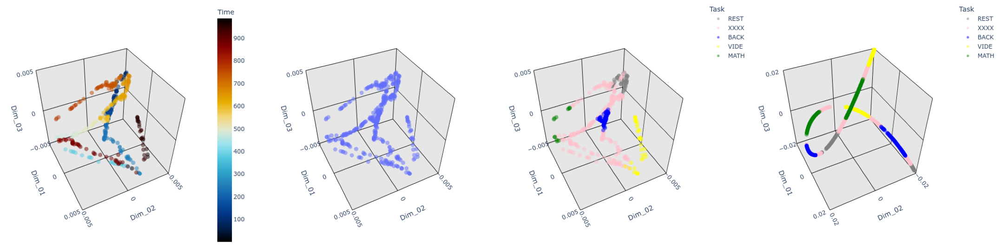

In [25]:
# Static version for github display
fig,axs = plt.subplots(1, 4, figsize=(30,10), sharex=True, sharey=True) 
for i,img_path in enumerate([osp.join(fig01_output_folder,'fig_time.png'),osp.join(fig01_output_folder,'fig_nocolor.png'),
                        osp.join(fig01_output_folder,'fig_task.png'),osp.join(fig01_output_folder,'fig_task_bad.png')]):
    img = mpimg.imread(img_path)
    axs[i].imshow(img)
    axs[i].axis('off')

## Example of how to use embeddings to temporally segment scans

One potential application of the embeddings is to decide how to temporally segment scans into units of interest for further analyses. There are many ways one could go around doing this.

One way would be to compute the distance of each point to the center of the embedding, as a first stept o find corners

In [26]:
import hvplot.pandas
import holoviews as hv
from scipy.signal import find_peaks
from sklearn.metrics import pairwise_distances
from nilearn.connectome import vec_to_sym_matrix
import seaborn as sns
from utils.basics import PNAS2015_folder

First, let's select the coordinates in the lower dimensional space and copy them into a new dataframe

In [27]:
data = LE_correct[['Dim_01','Dim_02','Dim_03']].copy()

Let's now compute the euclidean distance to the center of the embedding

In [28]:
dist_from_center = np.sqrt(np.power(data - data.mean(),2).sum(axis=1))

Let's now plot those distances

In [29]:
dist_from_center_PLOT = dist_from_center.hvplot(title='', c='k', xlabel='Time [temporal windows]', height=200).opts(toolbar=None)
pn.Row(dist_from_center_PLOT).save(osp.join(PRJ_DIR,'Outputs','Notebook_Figures','N02_Eucl_dist_to_center.png'))

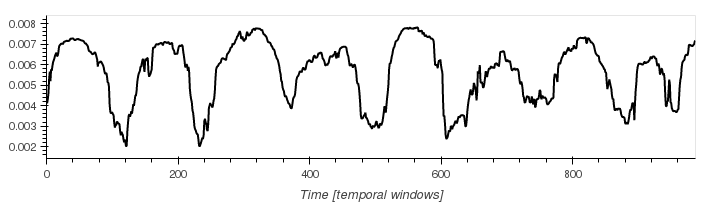

In [30]:
display.Image(osp.join(PRJ_DIR,'Outputs','Notebook_Figures','N02_Eucl_dist_to_center.png'))

Now let's find the peaks in the trace above

In [31]:
peaks = find_peaks(dist_from_center, width=20)

And for each peak, let's add a dashed line (signaling the peak) and a shaded region of 30 windows signaling the scan segments of interest around the peaks

In [32]:
for peak in peaks[0]:
    dist_from_center_PLOT = dist_from_center_PLOT * hv.VLine(peak).opts(line_color='b',line_dash='dashed', line_width=.75) * hv.Rectangles([(peak-15,0,peak+15,0.008), ]).opts(ylim=(0,0.008),alpha=0.5,line_width=0, color='gray')

Let's plot the new graph, as well as a matrix showing the relative distances of each point to every other point.

In [33]:
plot = pn.Row(dist_from_center_PLOT.opts(show_legend=False, shared_axes=False, width=1400, fontsize={'xlabel':20, 'xticks':12, 'yticks':12}),
              pd.DataFrame(pairwise_distances(data.iloc[peaks[0]])).hvplot.heatmap(aspect='square', frame_width=120, shared_axes=False, xlabel='Peak ID', ylabel='Peak ID', title='Peak-Peak Distance').opts(toolbar=None))
plot.save(osp.join(PRJ_DIR,'Outputs','Notebook_Figures','N02_Eucl_dist_to_center_with_peaks.png'))

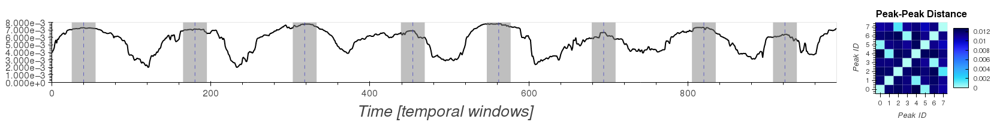

In [34]:
display.Image(osp.join(PRJ_DIR,'Outputs','Notebook_Figures','N02_Eucl_dist_to_center_with_peaks.png'))

The last component of manuscript Figure 01 is the connectivity matrices associated with each of these windows. The matrix form will be shown here. The associated brain view was generated using the CONN software. Here we will just save the data so that it is accesible to be loaded with CONN.

To do this, first we make a copy of the swc_W matrix and change the column IDs from being the task IDs, to simply being consecutive integers

In [35]:
swc_Z_copy = swc_Z.copy()
swc_Z_copy.columns = np.arange(swc_Z_copy.shape[1])

Next, we compute the average matrix using all windows. The only reason we do this, is becuase we will use that matrix to gather the optimal sorting of ROIs for rows and columns. Becuase we do not have ROIs sorted by networks, we will rely on sns.clustermap to get a sorting that is somehow meaningful. We will use that same sorting when we plot the different FC matrices in subsequent cells 

/data/SFIMJGC_HCP7T/Apps/envs/embeddings3/lib/python3.7/site-packages/seaborn/matrix.py:654: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



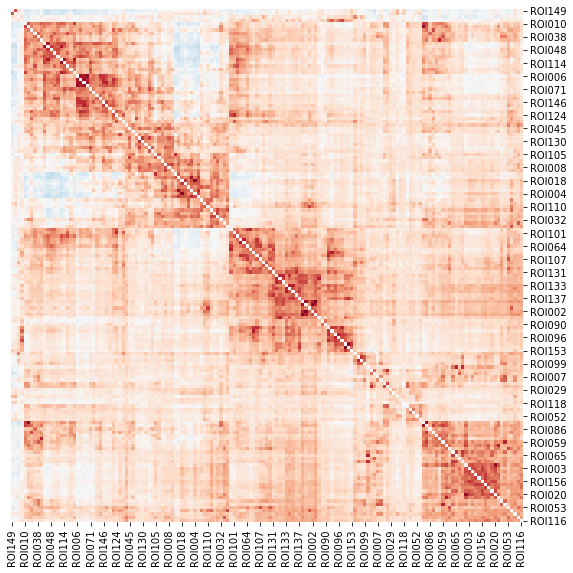

In [37]:
N_rois = 157
FC   = swc_Z.mean(axis=1)
FC_m = pd.DataFrame(np.zeros((N_rois,N_rois)), index=['ROI'+str(i).zfill(3) for i in range(157)], columns=['ROI'+str(i).zfill(3) for i in range(157)])
for c,r in FC.iteritems():
    FC_m.loc[c[0],c[1]] = r
FC_m = (FC_m + FC_m.T)/2
FC_c = sns.clustermap(FC_m, vmin=-.75, vmax=.75, cmap='RdBu_r')
FC_c.ax_row_dendrogram.set_visible(False)
FC_c.ax_col_dendrogram.set_visible(False)
FC_c.cax.set_visible(False)
sort_idx = ['ROI'+str(i).zfill(3) for i in FC_c.dendrogram_col.reordered_ind]

Now, we go on a window by window basis and we do two things:

* Save the matrix to disk, so that we can then load it in CONN
* Plot the matrix as a small heatmap

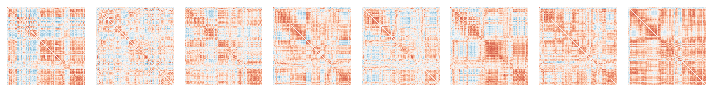

In [38]:
fig,axs = plt.subplots(1,8,figsize=(10,2.5))
for i,peak in enumerate(peaks[0]):
    #row,col = np.unravel_index(i,(2,4))
    a   = swc_Z_copy.loc[:,np.arange(peak-15,peak+15)].mean(axis=1).apply(np.tanh)
    a_m = pd.DataFrame(np.zeros((N_rois,N_rois)), index=['ROI'+str(i).zfill(3) for i in range(157)], columns=['ROI'+str(i).zfill(3) for i in range(157)])
    for c,r in a.iteritems():
        a_m.loc[c[0],c[1]] = r
    a_m = (a_m + a_m.T)/2
    sns.heatmap(a_m.loc[sort_idx,sort_idx], ax=axs[i], vmin=-.75, vmax=.75, cmap='RdBu_r', xticklabels=False, yticklabels=False, square=True, cbar=False)
    a_m.to_csv('./tmp/Fig01_Corner{i}_FC.txt'.format(i=str(i+1).zfill(2)), header=None, index=None)